# **Designing an Algorithm to Identify Pitch, Harmonics, and Noise in a Signal**

This notebook focuses on implementing a robust algorithm for analyzing audio signals to distinguish between pitch, harmonics, and noise. Identifying these components is crucial in fields like audio processing, music analysis, and communication systems.

The approach involves using advanced signal processing tools and techniques such as Fast Fourier Transform (FFT), spectrogram analysis, and filtering methods. We will leverage libraries like librosa for audio processing and scipy.signal for noise reduction using the Wiener filter. This notebook will demonstrate:



1.   Pitch Detection: Extracting the fundamental frequency of the audio signal.
2.   Harmonic Analysis: Identifying the overtone frequencies and their relation to the pitch.
3.   Noise Identification: Using adaptive filters to suppress unwanted noise while preserving important signal characteristics.


The combination of these methods will help illustrate the spectral and temporal properties of audio signals, offering insights into their structure and quality. Data visualization techniques, such as spectrograms and waveform plots, will be used to support the analysis.

In [5]:
# Necessary packages
from google.colab import drive
import numpy as np
import librosa
import os
import matplotlib.pyplot as plt
from scipy.signal import wiener
from scipy.signal import correlate, windows, butter, filtfilt
from scipy.fft import fft
import IPython.display as ipd

In [6]:
# Mounting the Google Drive
drive.mount('/content/drive')

Mounted at /content/drive


# **Clean Audio Sample**

In [ ]:
# Base directory and audio files
base_dir = "/content/drive/MyDrive/sample_audio/"
audio_files = ["violin_c.wav", "sax.wav", "piano_c.wav"]

## **Sampling Theorem:**
A continuous-time signal can be completely represented in its discrete-time form if it is sampled at a rate greater than or equal to twice its highest frequency component.

Let x(t) represent a continuous-time signal with a maximum frequency $f_{max}$. The sampling theorem dictates that the sampling frequency $f_{s}$ must satisfy:

$$ f_{s} \geq 2. f_{max} $$

Here:
$f_{s}$:  Sampling frequency (samples per second)
$f_{max}$: Maximum frequency of the signal

The signal's discrete representation is given as:

$$x[n] = x(t)|_{t=nT_{s}}$$

Where $T_{s} = \frac{1}{f_{s}}$ is the sampling interval.



Processing: violin_c.wav
Sampling Rate: 44100


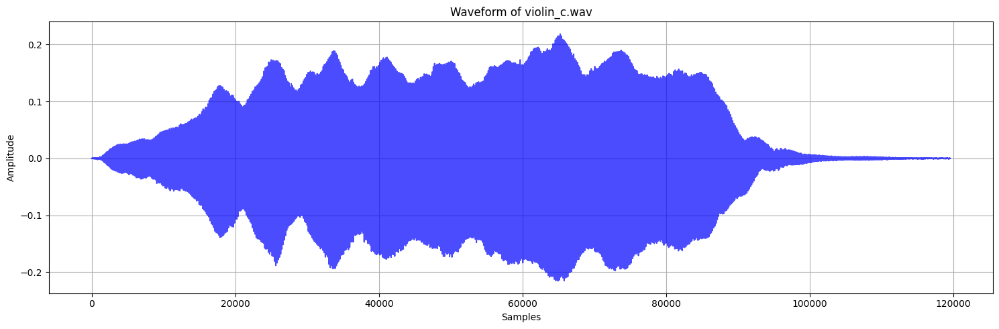

Processing: sax.wav
Sampling Rate: 44100


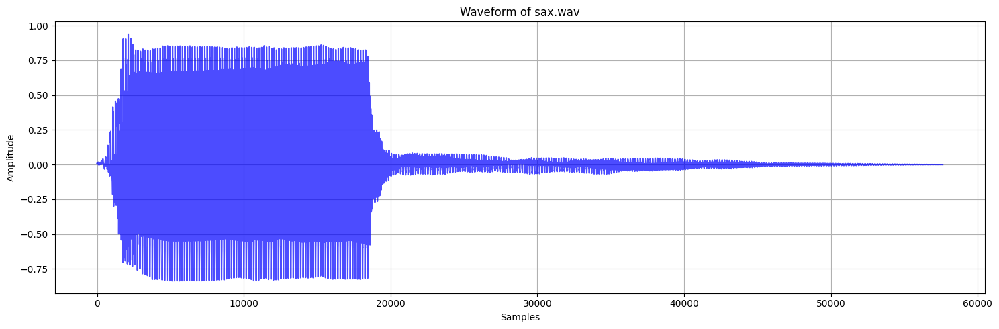

Processing: piano_c.wav
Sampling Rate: 44100


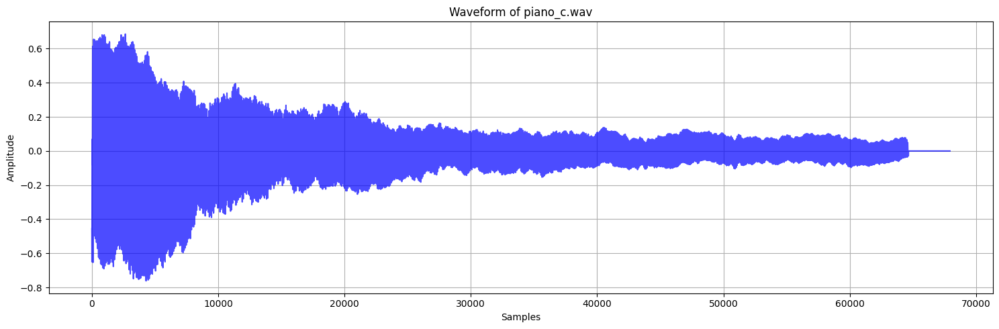

In [ ]:
# Base directory and audio files
base_dir = "/content/drive/MyDrive/sample_audio/"
audio_files = ["violin_c.wav", "sax.wav", "piano_c.wav"]

# Loop through each audio file
for audio_file in audio_files:
    file_path = os.path.join(base_dir, audio_file)
    audio_data, sampling_rate = librosa.load(file_path, sr=None)

    print(f"Processing: {audio_file}")
    print(f"Sampling Rate: {sampling_rate}")

    # Display audio player
    ipd.display(ipd.Audio(data=audio_data, rate=sampling_rate))

    # Plot the waveform
    plt.figure(figsize=(15, 5))
    plt.plot(audio_data, color="blue", alpha=0.7)
    plt.title(f"Waveform of {audio_file}")
    plt.xlabel("Samples")
    plt.ylabel("Amplitude")
    plt.grid(True)
    plt.tight_layout()
    plt.show()

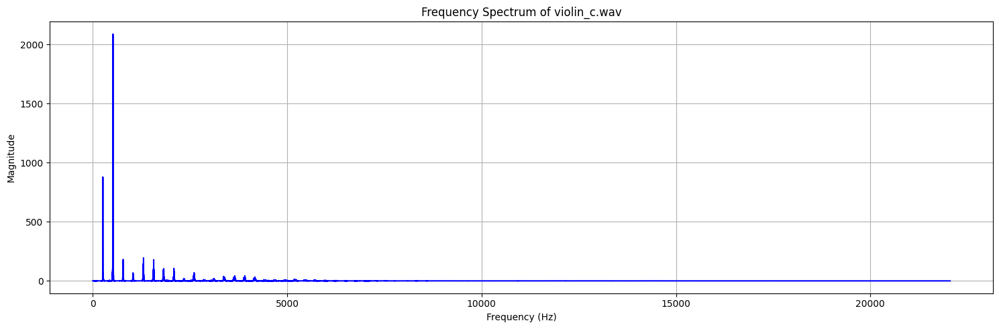

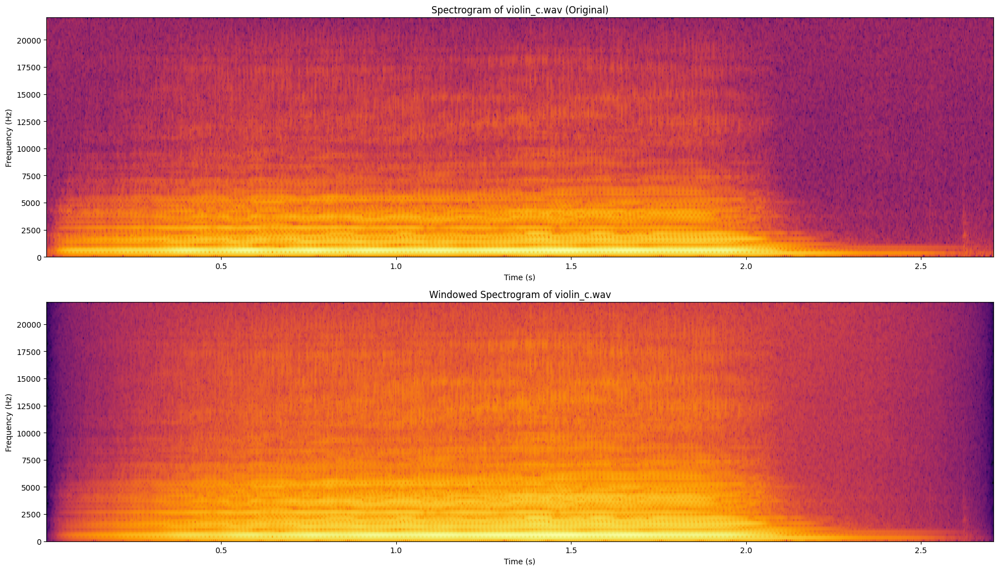

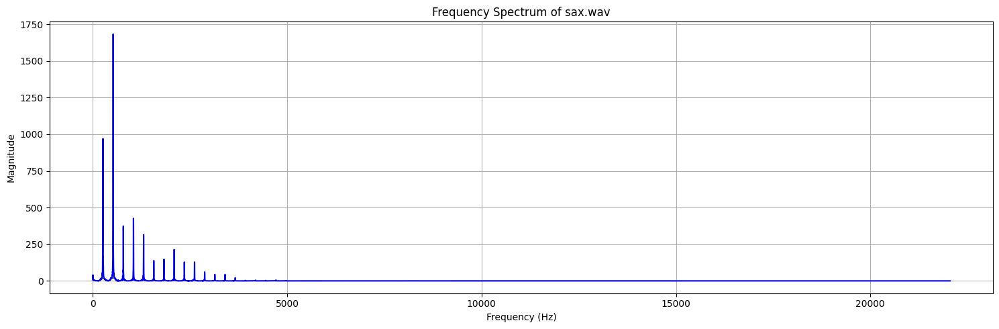

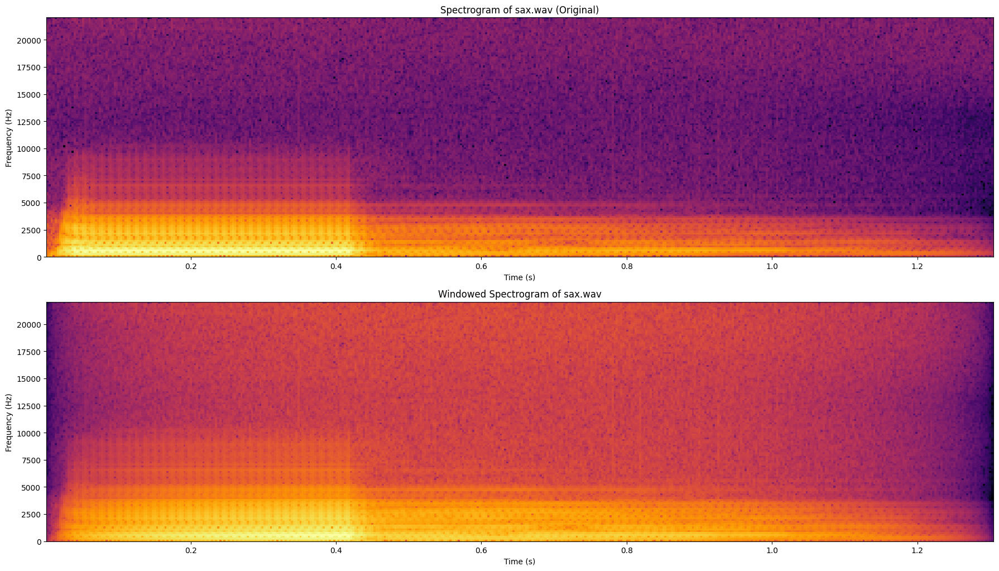

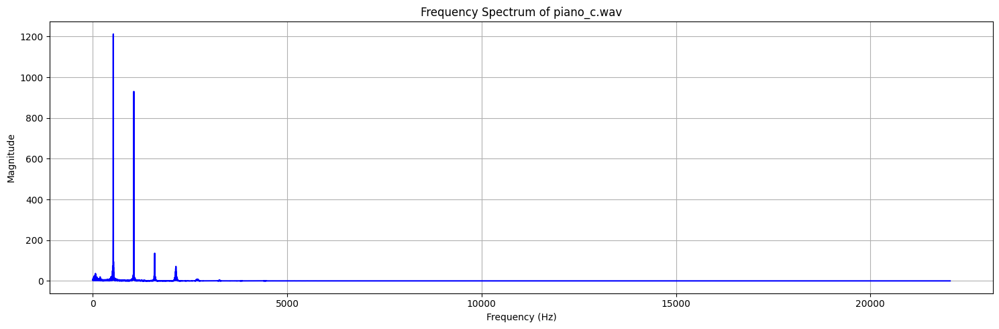

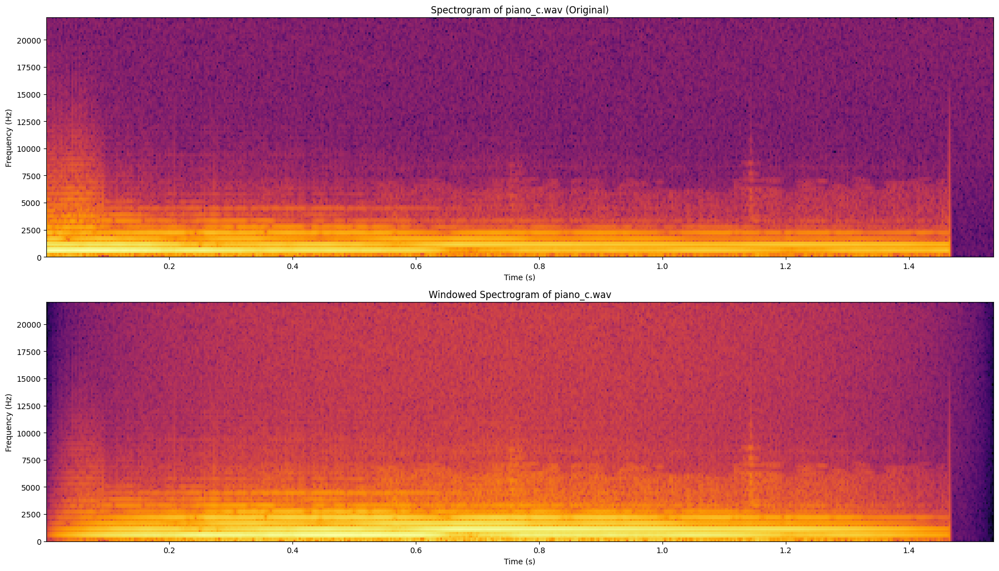

In [ ]:
# # Base directory and audio files
# base_dir = "/content/drive/MyDrive/sample_audio/"
# audio_files = ["violin_c.wav", "sax.wav", "piano_c.wav"]

# # Loops through each audio file
# for audio_file in audio_files:
#     file_path = os.path.join(base_dir, audio_file)
#     audio_data, sr = librosa.load(file_path, sr=None)

#     # Applying a Hanning window to the entire signal
#     window = windows.hann(len(audio_data))
#     windowed_signal = audio_data * window

#     # Computing the FFT of the windowed signal
#     fft_spectrum = fft(windowed_signal)
#     freqs = np.fft.fftfreq(len(fft_spectrum), 1/sr)
#     magnitude = np.abs(fft_spectrum)

#     # Plotting the frequency spectrum (Only positive frequencies)
#     plt.figure(figsize=(15, 5))
#     plt.plot(freqs[:len(freqs)//2], magnitude[:len(freqs)//2], color="blue")
#     plt.title(f"Frequency Spectrum of {audio_file}")
#     plt.xlabel("Frequency (Hz)")
#     plt.ylabel("Magnitude")
#     plt.grid(True)
#     plt.tight_layout()
#     plt.show()

#     # Plotting the spectrogram for the original signal (Noisy spectrogram)
#     plt.figure(figsize=(18, 15))
#     plt.subplot(3, 1, 1)
#     plt.specgram(audio_data, Fs=sr, cmap='inferno')
#     plt.title(f"Spectrogram of {audio_file} (Original)")
#     plt.xlabel("Time (s)")
#     plt.ylabel("Frequency (Hz)")

#     # Plotting the spectrogram for the windowed signal
#     plt.subplot(3, 1, 2)
#     plt.specgram(windowed_signal, Fs=sr, cmap='inferno')
#     plt.title(f"Windowed Spectrogram of {audio_file}")
#     plt.xlabel("Time (s)")
#     plt.ylabel("Frequency (Hz)")

#     plt.tight_layout()
#     plt.show()

# **Noisy Audio Signal**

### **Adding Gaussian Noise:**

If x(t) is the original audio signal and N(t) is the Gaussian noise with mean $\mu = 0$ and standard deviation $\sigma$, the noisy signal y(t) is:

$$ y(t) = x(t) + N(t)$$

Where:

1. $N(t) \equiv  N(0, \sigma^2)$
2. $\sigma$ = Noise Level



In [ ]:
# def add_noise(signal, noise_level=0.01):
#     """
#     Add random Gaussian noise to a signal.

#     Parameters:
#     - signal: The original audio signal.
#     - noise_level: Amplitude of the noise (default is 0.01).

#     Returns:
#     - noisy_signal: The audio signal with added noise.
#     """
#     noise = np.random.normal(0, noise_level, signal.shape)
#     noisy_signal = signal + noise
#     return noisy_signal

### **Running The Noisy Signal**

In [ ]:
# Base directory and audio files
base_dir = "/content/drive/MyDrive/noisy_audio/"
audio_files = ["violin_c.wav", "sax.wav", "piano_c.wav"]

Processing: violin_c.wav
Sampling Rate: 44100


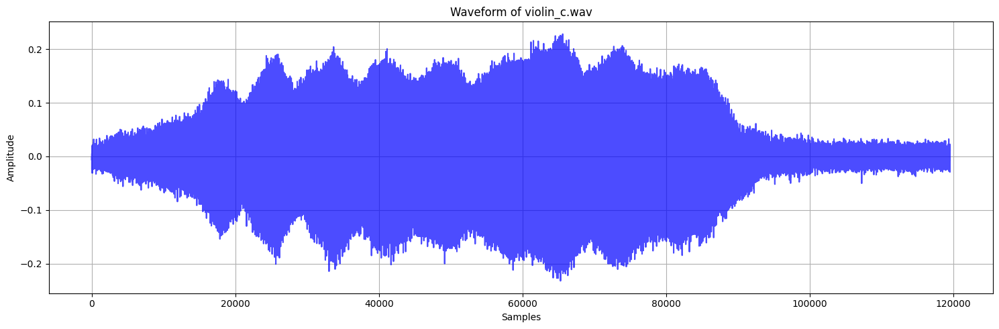

Processing: sax.wav
Sampling Rate: 44100


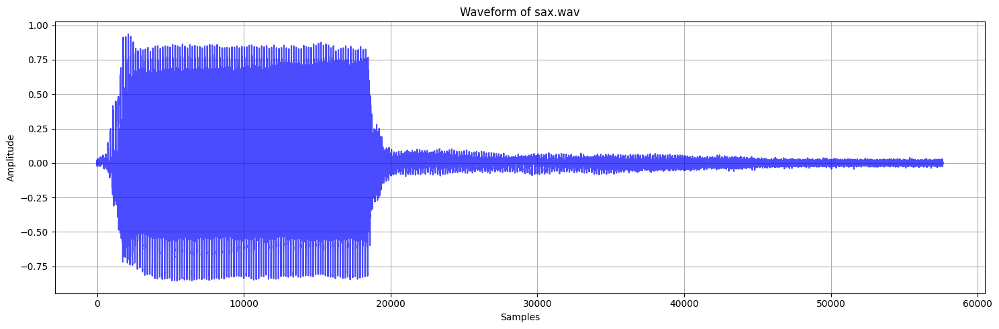

Processing: piano_c.wav
Sampling Rate: 44100


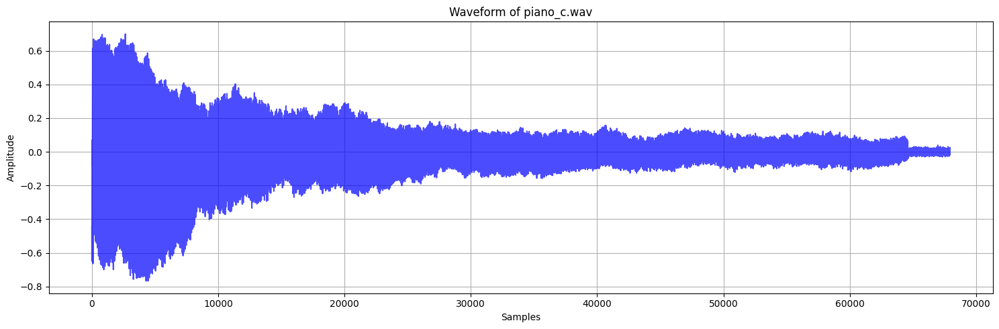

In [ ]:
# Loop through each audio file
for audio_file in audio_files:
    file_path = os.path.join(base_dir, audio_file)
    audio_data, sampling_rate = librosa.load(file_path, sr=None)

    print(f"Processing: {audio_file}")
    print(f"Sampling Rate: {sampling_rate}")

    # Display audio player
    ipd.display(ipd.Audio(data=audio_data, rate=sampling_rate))

    # Plot the waveform
    plt.figure(figsize=(15, 5))
    plt.plot(audio_data, color="blue", alpha=0.7)
    plt.title(f"Waveform of {audio_file}")
    plt.xlabel("Samples")
    plt.ylabel("Amplitude")
    plt.grid(True)
    plt.tight_layout()
    plt.show()

# **FFT, Windowing and Normalization**


### **FFT:**

The "Fast Fourier Transform" (FFT) is an important measurement method in the science of audio and acoustics measurement. It converts a signal into individual spectral components and thereby provides frequency information about the signal. The FFT is an optimized algorithm for the implementation of the "Discrete Fourier Transformation" (DFT). A signal is sampled over a period of time and divided into its frequency components. These components are single sinusoidal oscillations at distinct frequencies each with their own amplitude and phase.

For the DFT equation is be,

$$X[k] = \sum_{n=0}^{N-1} x[n] e^{-j 2π \frac{kn}{N}}$$

Where,

*   $k = 0,1,2,....,N-1$
*   $X[k] = $  Frequency Domain Representation
*   $x[n] = $  Input Signal Sequence
*   $N$ = Total Number of Samples


In the Fourier transformation, the assumption is that the sampled signal segment is repeated periodically for an infinite period of time. This brings two conclusions:

1. The FFT is only suitable for periodic signals.
2. The sampled signal segment must contain a whole number of periods.

It can be seen that condition 2. would apply only to very few signals. The sampling of a signal whose frequencies are not an integer multiple of resolution would begin and end within a block of 2^n samples with different values. This results in a jump in the time signal, and a "smeared" FFT spectrum. (aka Leakage)


### **Windowing**:

In order to prevent this smearing, in practice "windowing" is applied to the signal sample. Using a weighting function, the signal sample is more or less gently turned on and off. The result is that the sampled and subsequent "windowed" signal begins and ends at amplitude zero. The sample can now be repeated periodically without a hard transition. Mathematically, when another function or waveform/data-sequence is "multiplied" by a window function, the product is also zero-valued outside the interval. As we have used **Hanning window**. The formula for this is:


$$w[n] = 0.5[1-\cos(\frac{2πn}{N})]$$

Main difference between **Hanning Window** and **Hamming Window** that the end point touches zero.

Given the context of noisy audio signals, the Hanning window provides:

Lower side lobes, reducing spectral leakage from noise.

*   A cleaner frequency spectrum for visual and quantitative analysis.
*   Smooth edges, reducing artifacts in the spectrograms.
*   Smooth edges, reducing artifacts in the spectrograms.


If you we were to use a Hamming window instead, the slightler higher side lobes could allow more noise into the spectrum, which might not be ideal for your audio analysis task. The choice of Hanning balances suppression of unwanted frequencies with accurate representation of the desired signal components.


### **Normalization:**

Audio normalization is the application of a constant amount of gain to an audio recording to bring the amplitude to a target level (the norm). Because the same amount of gain is applied across the entire recording, the signal-to-noise ratio and relative dynamics are unchanged. We didn't do any kind of normalization here.

**"We only focused on low frquency components here which is our limitations but with the data I have used using focusing on low frequency is good enough"**



### **Manual FFT**

In [2]:
# # Building FFT

# import numpy as np

# def recursive_fft(x):
#     N = len(x)
#     # Base case: if the input contains only one sample, return it
#     if N == 1:
#         return x

#     # Ensure input length is a power of 2 (this is a requirement for FFT)
#     if np.log2(N) % 1 > 0:
#         raise ValueError("Input length must be a power of 2")

#     # Splitting the signal into even and odd indexed parts
#     even = recursive_fft(x[::2])
#     odd = recursive_fft(x[1::2])

#     # Combining the results
#     T = np.exp(-2j * np.pi * np.arange(N) / N)[:N // 2] * odd
#     return np.concatenate([even + T, even - T])

# # Example usage
# x = np.array([1, 2, 3, 4])  # Example signal
# N = len(x)

# # Computing FFT manually
# X_fft_manual = recursive_fft(x)
# print("Manual FFT result:", X_fft_manual)

# # Comparing with numpy/scipy FFT
# from scipy.fft import fft
# X_fft_builtin = fft(x)
# print("Built-in FFT result:", X_fft_builtin)

# # Checking if they match
# print("Difference:", np.abs(X_fft_manual - X_fft_builtin))

Manual FFT result: [10.+0.j -2.+2.j -2.+0.j -2.-2.j]
Built-in FFT result: [10.-0.j -2.+2.j -2.-0.j -2.-2.j]
Difference: [0.00000000e+00 0.00000000e+00 0.00000000e+00 2.22044605e-16]


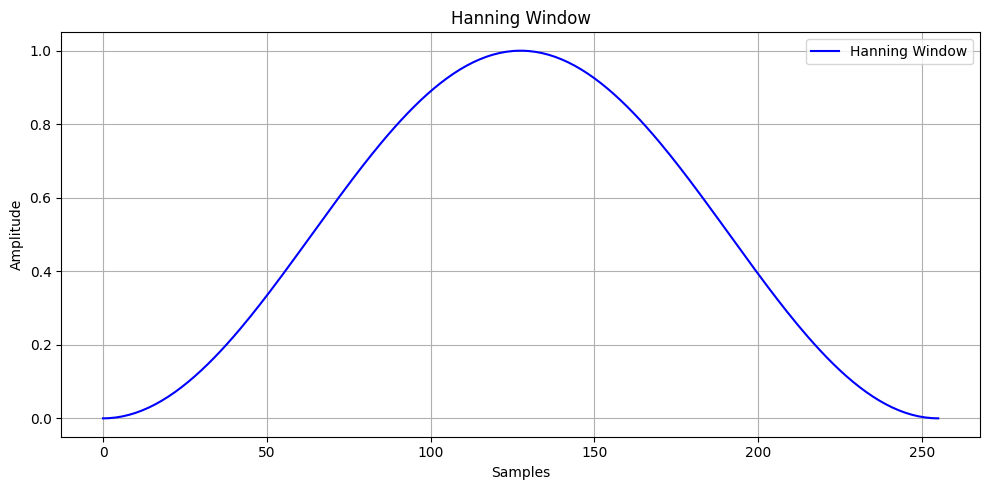

In [3]:
# # Hanning Window Manually
# import numpy as np
# import matplotlib.pyplot as plt

# def hanning_window(N):
#     """
#     Computing the Hanning window manually.

#     Parameters:
#         N (int): Number of points in the window.

#     Returns:
#         numpy.ndarray: Hanning window of size N.
#     """
#     return 0.5 * (1 - np.cos(2 * np.pi * np.arange(N) / (N - 1)))

# # Example usage
# N = 256  # Length of the Hanning window
# hanning_win = hanning_window(N)

# # Plotting the Hanning window
# plt.figure(figsize=(10, 5))
# plt.plot(hanning_win, label="Hanning Window", color="blue")
# plt.title("Hanning Window")
# plt.xlabel("Samples")
# plt.ylabel("Amplitude")
# plt.grid(True)
# plt.legend()
# plt.tight_layout()
# plt.show()


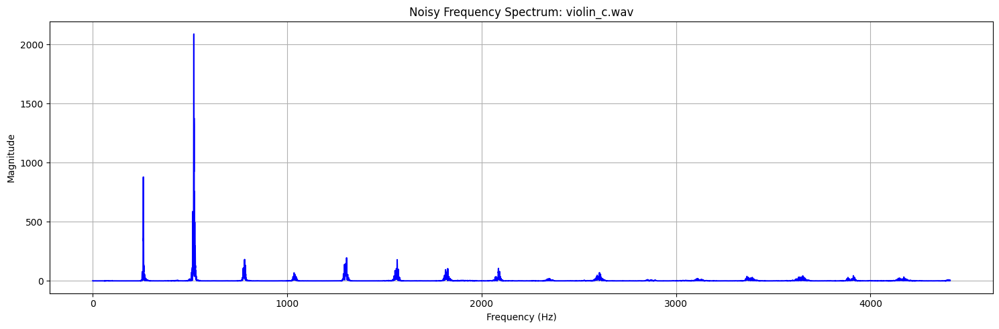

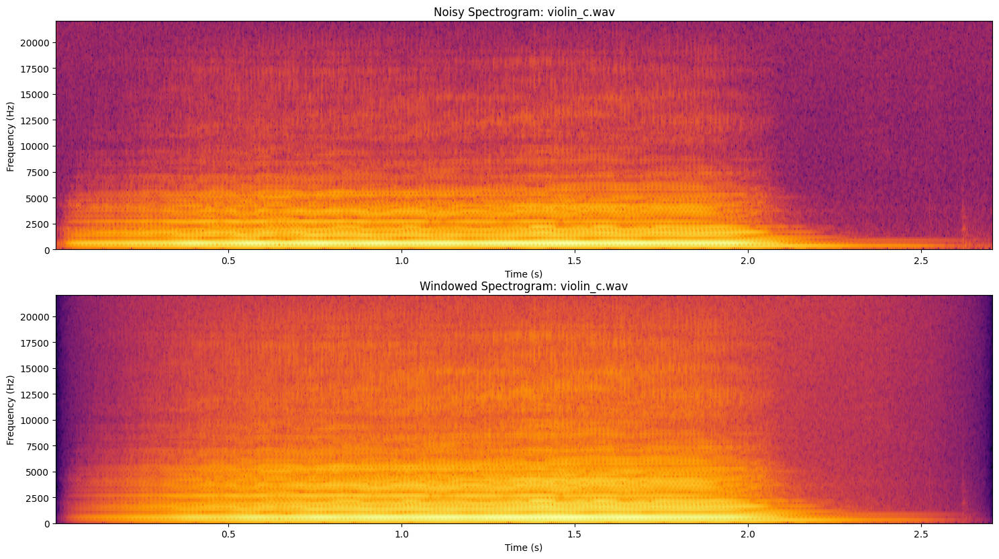

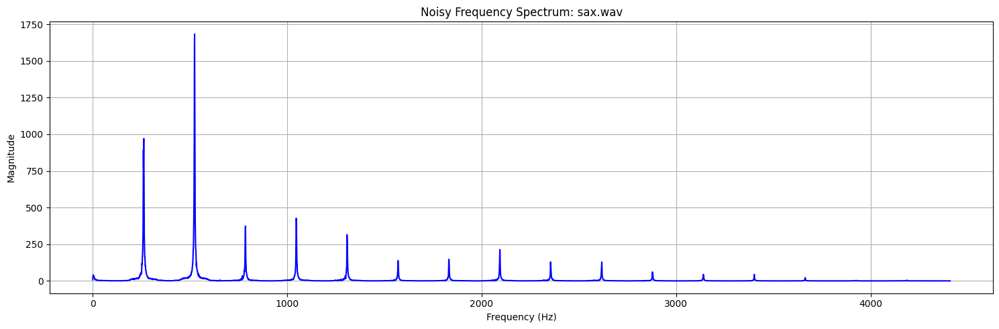

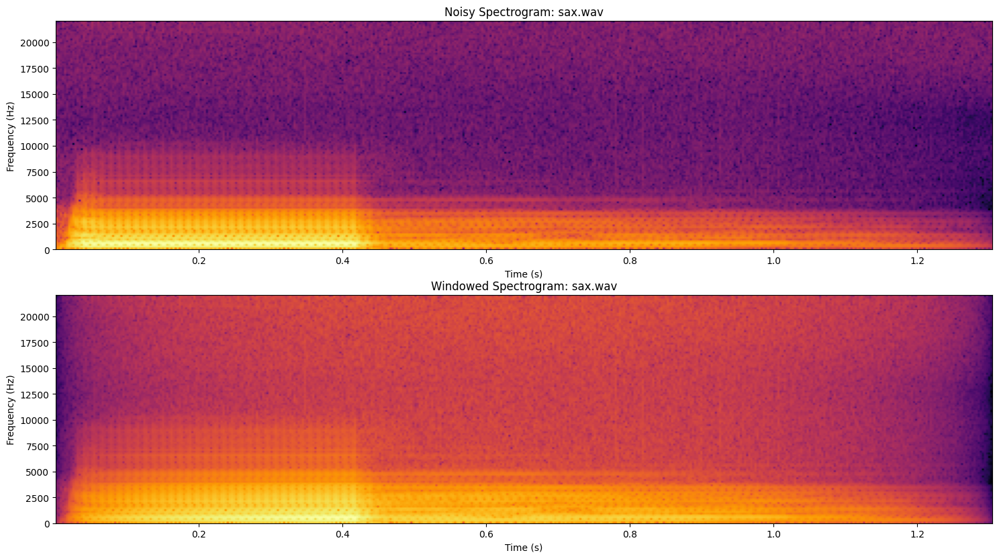

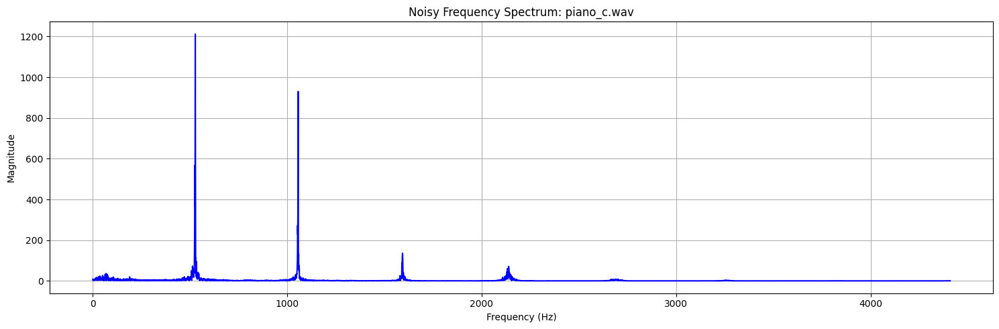

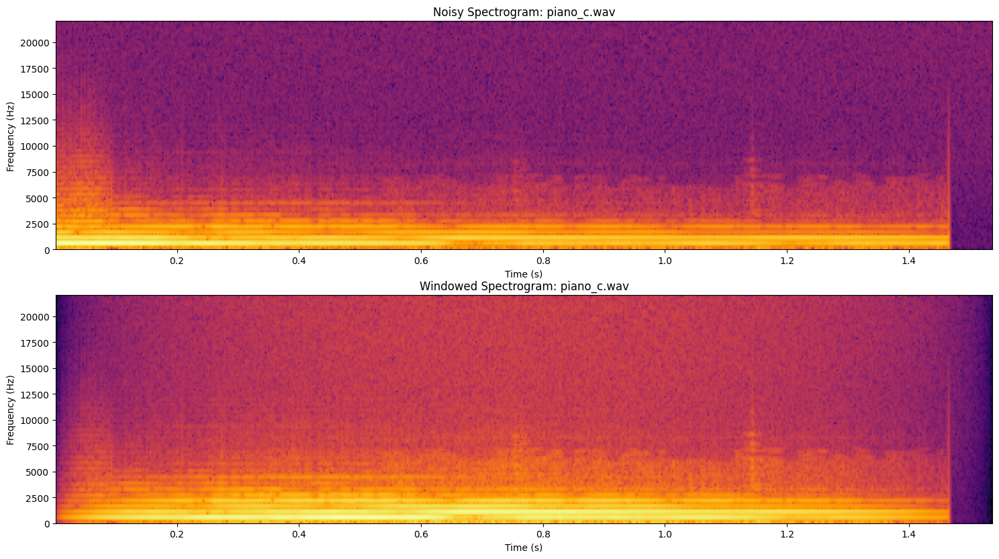

In [ ]:
for audio_file in audio_files:
  file_path = os.path.join(base_dir, audio_file)
  audio_data, sr = librosa.load(file_path, sr=None)

  window = windows.hann(len(audio_data))
  windowed_signal = audio_data * window

  fft_spectrum = fft(windowed_signal)
  freqs = np.fft.fftfreq(len(fft_spectrum), 1/sr)
  magnitude = np.abs(fft_spectrum)

  plt.figure(figsize=(15, 5))
  plt.plot(freqs[:len(freqs)//10], magnitude[:len(freqs)//10], color="blue") # limitting the plot to the lower frequencies (e.g., up to 1/10th of the spectrum)
  plt.title(f"Noisy Frequency Spectrum: {audio_file}")
  plt.xlabel("Frequency (Hz)")
  plt.ylabel("Magnitude")
  plt.grid(True)
  plt.tight_layout()
  plt.show()

  plt.figure(figsize=(18, 15))
  plt.subplot(3,1,1)
  plt.specgram(audio_data, Fs=sr, cmap='inferno')
  plt.title(f"Noisy Spectrogram: {audio_file}")
  plt.xlabel("Time (s)")
  plt.ylabel("Frequency (Hz)")

  plt.subplot(3,1,2)
  plt.specgram(windowed_signal, Fs=sr, cmap='inferno')
  plt.title(f"Windowed Spectrogram: {audio_file}")
  plt.xlabel("Time (s)")
  plt.ylabel("Frequency (Hz)")

# **Pitch, Harmonics and Noise**
The pitch is determined by the fundamental frequency of an audio signal, and harmonics are integer multiples of this frequency that contribute to the timbre.
If we subtract the fundamental frequency and its harmonics from the signal, the residual signal may contain non-harmonic components (often referred to as noise), but not necessarily pure noise. Noise in this context usually refers to unwanted components that don't follow a harmonic structure and may include a broad range of frequencies without a specific periodic pattern.

**I am considering the audio signal is not monophonic if it is monophonic then we could have been use pYin algorithm but here we used autocorrelation to find pitch and harmonics manually**

### **Autocorrelation:**
Autocorrelation is a mathematical operation that measures how a signal is correlated with a delayed version of itself. It helps to detect periodicity or the pitch of the signal. For a finite discrete signal, the autocorrelation is computed as:

$$ R_{x}[k] = \sum_{n=0}^{N-k-1} x[n].x[n+k]$$


Where,
*   $N$ is the lenght of the sample
*   The sum is taken from $n=0$ to $n = N-k-1$, which ensures that both $x[n]$ and $x[n+k]$ are valid values within the bounds of the signal

The pitch is calculated by dividing the sample rate by the lag at which the first peak occurs. This gives the fundamental frequency $f_{0}$ in $Hz$. It can be written as:

$$f_{0} = \frac{1}{Τ_{max}}$$

Where the nth harmonic of fundamental frquency is $f_{0}$

$ f_{n} = n.f_{0}$ for $n = 2,3,4, ...$




In [34]:
# List of audio files
audio_files = ["violin_c.wav", "sax.wav", "piano_c.wav"]
base_dir = "/content/drive/MyDrive/noisy_audio/"  # Adjust the directory path as necessary

# Function to compute autocorrelation
def autocorrelation(x):
    result = np.correlate(x, x, mode='full')
    return result[result.size // 2:]

# Function to find pitch using autocorrelation
def find_pitch(autocorr, sr):
    lag = np.argmax(autocorr[1:]) + 1  # Skip lag 0
    pitch = sr / lag
    return pitch, lag

# Function to calculate harmonics
def calculate_harmonics(pitch, num_harmonics=5):
    harmonics = [pitch * (i+2) for i in range(num_harmonics)]
    return harmonics

# Processing each audio file
for audio_file in audio_files:
    file_path = os.path.join(base_dir, audio_file)

    try:
        # Loading the audio file
        audio_data, sr = librosa.load(file_path, sr=None)

        # Applying pre-emphasis (optional)
        audio_data = librosa.effects.preemphasis(audio_data)

        # Computing the autocorrelation of the signal
        autocorr = autocorrelation(audio_data)

        # Finding the pitch
        pitch, lag = find_pitch(autocorr, sr)

        # Calculating harmonics
        harmonics = calculate_harmonics(pitch)

        # Printing the estimated pitch and harmonics
        print(f"Estimated pitch (F0) for {audio_file}: {pitch:.2f} Hz")
        for i, harmonic in enumerate(harmonics, 1):
            print(f"Harmonic {i} for {audio_file}: {harmonic:.2f} Hz")

    except FileNotFoundError:
        print(f"File not found: {audio_file}")


Estimated pitch (F0) for violin_c.wav: 260.95 Hz
Harmonic 1 for violin_c.wav: 521.89 Hz
Harmonic 2 for violin_c.wav: 782.84 Hz
Harmonic 3 for violin_c.wav: 1043.79 Hz
Harmonic 4 for violin_c.wav: 1304.73 Hz
Harmonic 5 for violin_c.wav: 1565.68 Hz
Estimated pitch (F0) for sax.wav: 260.95 Hz
Harmonic 1 for sax.wav: 521.89 Hz
Harmonic 2 for sax.wav: 782.84 Hz
Harmonic 3 for sax.wav: 1043.79 Hz
Harmonic 4 for sax.wav: 1304.73 Hz
Harmonic 5 for sax.wav: 1565.68 Hz
Estimated pitch (F0) for piano_c.wav: 531.33 Hz
Harmonic 1 for piano_c.wav: 1062.65 Hz
Harmonic 2 for piano_c.wav: 1593.98 Hz
Harmonic 3 for piano_c.wav: 2125.30 Hz
Harmonic 4 for piano_c.wav: 2656.63 Hz
Harmonic 5 for piano_c.wav: 3187.95 Hz


### **Mean Squared Error (MSE):**
The difference between the original signal and a denoised version can also be used to detect noise. If the error (difference) is large, it indicates the presence of noise. For mathematical formula it can written as:

$$MSE = \frac{1}{N} \sum_{n=1}^{N}(x_{clean}[n]- x_{noisy}[n])^2$$

Where, $x_{clean}[n]$ is the original signal and $x_{noisy}[n]$ is the noised signal.


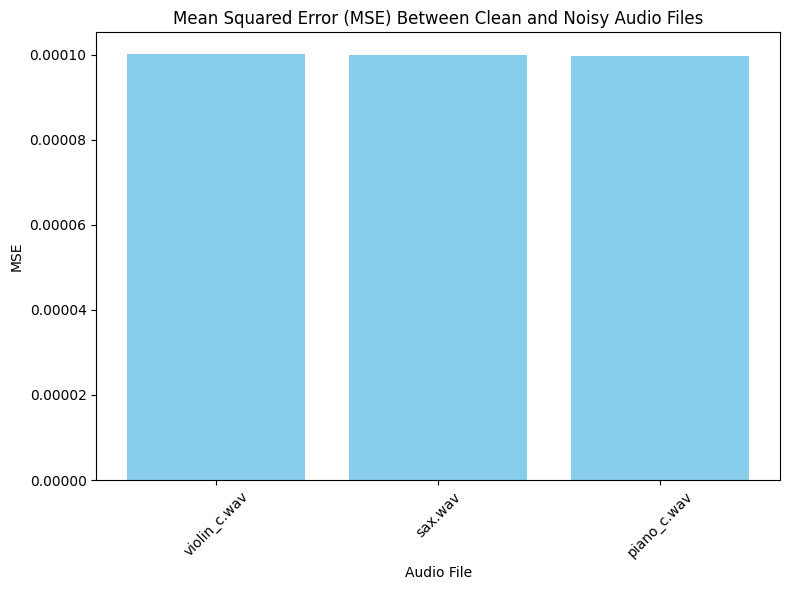

In [37]:
import librosa
import numpy as np
import os
import matplotlib.pyplot as plt

# Define clean and noisy audio files
clean_audio_files = ["violin_c.wav", "sax.wav", "piano_c.wav"]
noisy_audio_files = ["violin_c.wav", "sax.wav", "piano_c.wav"]
base_dir1 = "/content/drive/MyDrive/sample_audio"
base_dir2 = "/content/drive/MyDrive/noisy_audio/"


# Function to compute Mean Squared Error (MSE)
def calculate_mse(clean_signal, noisy_signal):
    mse = np.mean((clean_signal - noisy_signal) ** 2)
    return mse

# List to store MSE values
mse_values = []
audio_file_labels = []

# Processing each audio file pair (clean vs noisy)
for clean_audio, noisy_audio in zip(clean_audio_files, noisy_audio_files):
    clean_file_path = os.path.join(base_dir1, clean_audio)
    noisy_file_path = os.path.join(base_dir2, noisy_audio)

    try:
        # Load the clean and noisy audio files
        clean_audio_data, sr = librosa.load(clean_file_path, sr=None)
        noisy_audio_data, sr = librosa.load(noisy_file_path, sr=None)

        # Ensure both signals have the same length (truncate if necessary)
        min_length = min(len(clean_audio_data), len(noisy_audio_data))
        clean_audio_data = clean_audio_data[:min_length]
        noisy_audio_data = noisy_audio_data[:min_length]

        # Calculate MSE between clean and noisy audio
        mse = calculate_mse(clean_audio_data, noisy_audio_data)
        mse_values.append(mse)
        audio_file_labels.append(clean_audio)

    except FileNotFoundError:
        print(f"File not found: {clean_audio} or {noisy_audio}")

# Plotting the MSE values
plt.figure(figsize=(8, 6))
plt.bar(audio_file_labels, mse_values, color='skyblue')
plt.title("Mean Squared Error (MSE) Between Clean and Noisy Audio Files")
plt.xlabel("Audio File")
plt.ylabel("MSE")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

### **References:**



*   A FUNDAMENTAL FREQUENCY ESTIMATOR
USING PROBABILISTIC THRESHOLD DISTRIBUTIONS, Matthias Mauch and Simon Dixon
*   https://www.ni.com/en/shop/data-acquisition/measurement-fundamentals/analog-fundamentals/understanding-ffts-and-windowing.html?srsltid=AfmBOorKmknCJEaBYtPm_RTKmZWYPKwuk8yj3g2wPCST8xSCRes9Mvh9
*   https://www.nti-audio.com/en/support/know-how/fast-fourier-transform-fft#:~:text=The%20%22Fast%20Fourier%20Transform%22%20(frequency%20information%20about%20the%20signal).
*   https://en.wikipedia.org/wiki/Window_function







